<a href="https://colab.research.google.com/github/MitaliDogra/DS/blob/main/IPR_EXp.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

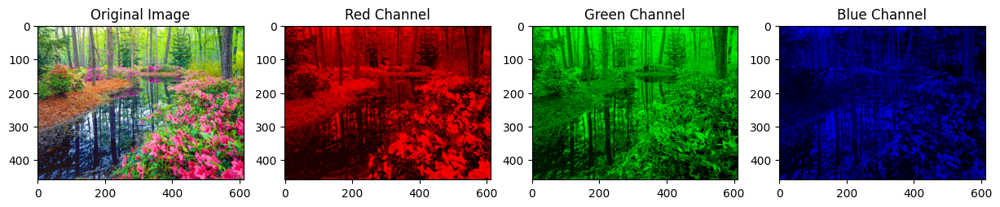

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image
img = cv2.imread('image.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) # Convert from BGR to RGB

# Separate the channels
r, g, b = cv2.split(img)

# Create a blank image with zeros for the other channels
zeros = np.zeros(img.shape[:2], dtype="uint8")

# Display the channels
plt.figure(figsize=(15, 5))

plt.subplot(1, 4, 1)
plt.imshow(img)
plt.title('Original Image')

plt.subplot(1, 4, 2)
plt.imshow(cv2.merge([r, zeros, zeros]))
plt.title('Red Channel')

plt.subplot(1, 4, 3)
plt.imshow(cv2.merge([zeros, g, zeros]))
plt.title('Green Channel')

plt.subplot(1, 4, 4)
plt.imshow(cv2.merge([zeros, zeros, b]))
plt.title('Blue Channel')

plt.show()

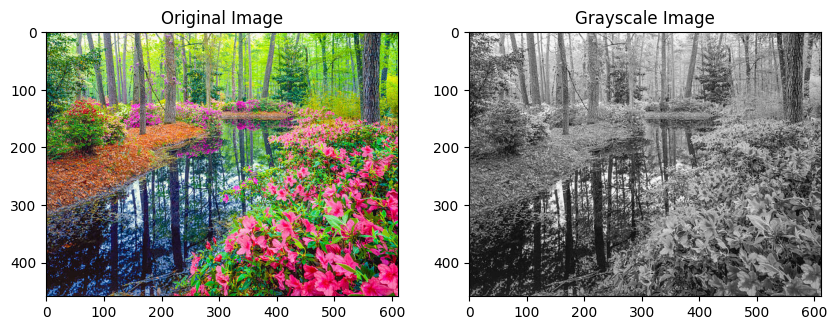

In [ ]:
# Convert to grayscale
gray_image = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

# Display the grayscale image
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title('Original Image')

plt.subplot(1, 2, 2)
plt.imshow(gray_image, cmap='gray')
plt.title('Grayscale Image')

plt.show()

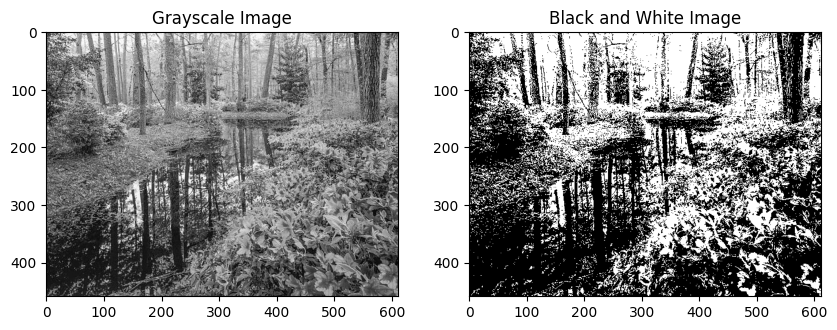

In [ ]:
# Apply a threshold to create a binary (black and white) image
(T, black_white_image) = cv2.threshold(gray_image, 127, 255, cv2.THRESH_BINARY)

# Display the black and white image
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(gray_image, cmap='gray')
plt.title('Grayscale Image')

plt.subplot(1, 2, 2)
plt.imshow(black_white_image, cmap='gray')
plt.title('Black and White Image')

plt.show()

In [ ]:
# Print the dimensions and the pixel values of the black and white image
print("Shape of the Black and White Image (Height, Width):", black_white_image.shape)
print("\nPixel Values (a portion of the array):\n")
print(black_white_image[100:110, 100:110]) # Display a small 10x10 sub-section of the image

Shape of the Black and White Image (Height, Width): (459, 612)

Pixel Values (a portion of the array):

[[255 255 255 255 255 255   0 255   0 255]
 [255 255 255 255 255 255   0 255 255   0]
 [255 255 255 255 255 255   0 255 255   0]
 [255 255 255 255 255 255   0 255   0 255]
 [255 255   0   0 255 255   0 255   0   0]
 [255   0 255 255 255 255   0 255 255 255]
 [255 255 255 255 255 255   0   0 255 255]
 [255 255 255 255 255 255   0   0 255   0]
 [255 255 255 255 255 255   0   0 255   0]
 [  0 255 255 255 255 255   0   0 255 255]]


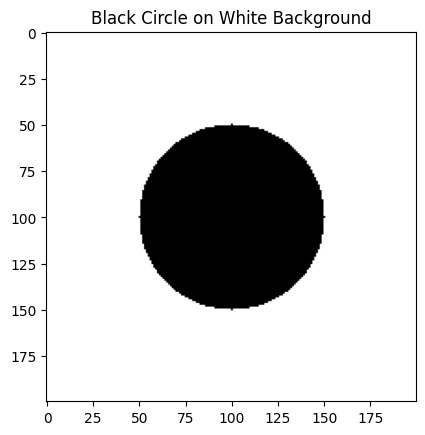

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Define the image size
width = 200
height = 200

# Create a blank white image (200x200 pixels) in a single channel
# The dtype="uint8" and multiplying by 255 creates an image with
# a single channel where all pixel values are 255 (white).
image = np.ones((height, width), dtype="uint8") * 200

# Define the circle's properties
center_coordinates = (width // 2, height // 2) # The center of the image
radius = 50
color = 0  # In this single-channel image, 0 represents black.
thickness = -1 # -1 fills the circle

# Draw the black circle on the white background
cv2.circle(image, center_coordinates, radius, color, thickness)

# Display the image using a 'gray' colormap to correctly render the single channel
plt.imshow(image, cmap='gray')
plt.title('Black Circle on White Background')
plt.axis('on') # Hide the coordinate axes
plt.show()

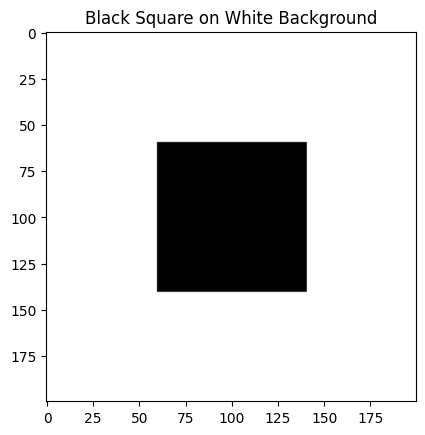

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Define the image size
width = 200
height = 200

# Create a blank white image (200x200 pixels) in a single channel
# The value 255 represents white, and uint8 is the standard data type for pixel values
image = np.ones((height, width), dtype="uint8") * 255

# Define the square's properties
# The starting point (top-left corner) of the rectangle
start_point = (60, 60)
# The ending point (bottom-right corner) of the rectangle
end_point = (140, 140)
color = 0  # 0 represents black in a single-channel image
thickness = -1 # -1 fills the shape

# Draw the black square on the white background
cv2.rectangle(image, start_point, end_point, color, thickness)

# Display the image using a 'gray' colormap to correctly render the single channel
plt.imshow(image, cmap='gray')
plt.title('Black Square on White Background')
plt.axis('on') # Hide the coordinate axes
plt.show()

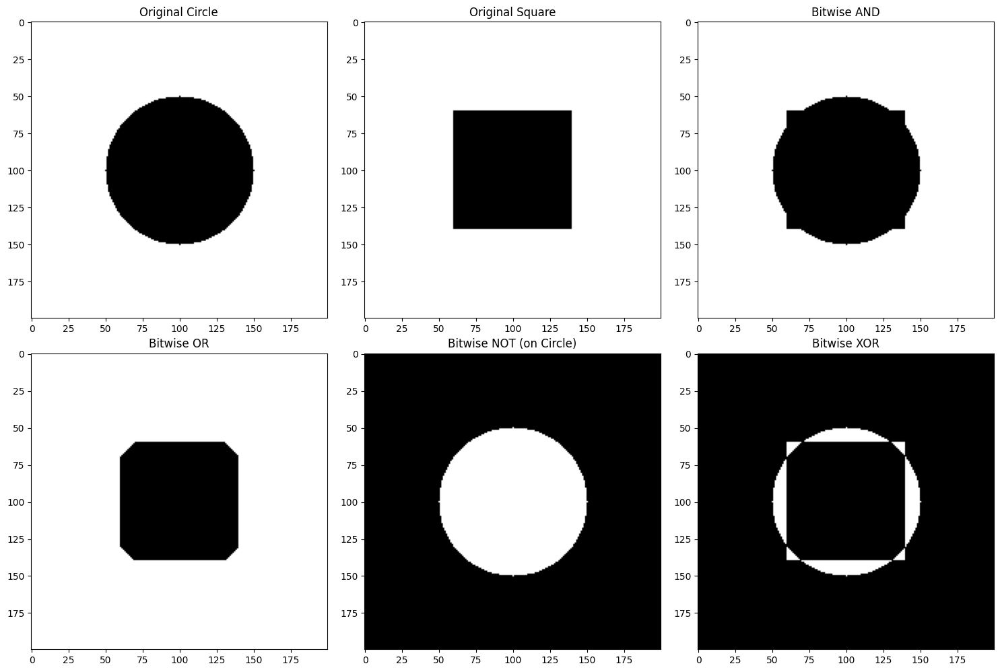

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Define the image size
width = 200
height = 200

# Create a blank white image for the circle
circle_image = np.ones((height, width), dtype=np.uint8) * 255
# Draw a black circle by setting pixels within the radius to 0
center_y, center_x = height // 2, width // 2
radius = 50
y, x = np.ogrid[-center_y:height - center_y, -center_x:width - center_x]
mask = x*x + y*y <= radius*radius
circle_image[mask] = 0

# Create a blank white image for the square
square_image = np.ones((height, width), dtype=np.uint8) * 255
# Draw a black square by setting pixels within the bounding box to 0
start_x, start_y = 60, 60
end_x, end_y = 140, 140
square_image[start_y:end_y, start_x:end_x] = 0

# --- Perform Bitwise Operations ---
bitwise_and = circle_image & square_image
bitwise_or = circle_image | square_image
bitwise_not = ~circle_image # ~ is the bitwise NOT operator for NumPy arrays
bitwise_xor = circle_image ^ square_image

# --- Display the results ---
plt.figure(figsize=(15, 10))

# Original Images
plt.subplot(2, 3, 1)
plt.imshow(circle_image, cmap='gray')
plt.title('Original Circle')
plt.axis('on')

plt.subplot(2, 3, 2)
plt.imshow(square_image, cmap='gray')
plt.title('Original Square')
plt.axis('on')

# Result of Bitwise AND
plt.subplot(2, 3, 3)
plt.imshow(bitwise_and, cmap='gray')
plt.title('Bitwise AND')
plt.axis('on')

# Result of Bitwise OR
plt.subplot(2, 3, 4)
plt.imshow(bitwise_or, cmap='gray')
plt.title('Bitwise OR')
plt.axis('on')

# Result of Bitwise NOT on the circle
plt.subplot(2, 3, 5)
plt.imshow(bitwise_not, cmap='gray')
plt.title('Bitwise NOT (on Circle)')
plt.axis('on')

# Result of Bitwise XOR
plt.subplot(2, 3, 6)
plt.imshow(bitwise_xor, cmap='gray')
plt.title('Bitwise XOR')
plt.axis('on')

plt.tight_layout()
plt.show()

In [ ]:
import cv2
import numpy as np

def count_cars_with_connected_components(image_path, color_name, hsv_lower, hsv_upper, min_area=500):
    image = cv2.imread('cars.jpg')
    if image is None:
        print("Error: Image not found.")
        return 0

    # Convert the image from BGR to HSV color space for better color detection
    hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    # 1. Isolate the color to create a binary mask
    mask = cv2.inRange(hsv_image, hsv_lower, hsv_upper)

    # 2. Find all connected components
    # The function returns the total number of labels, the labels matrix, stats, and centroids
    num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(mask, connectivity=8)

    car_count = 0
    # We start the loop from 1 to ignore the background (label 0)
    for i in range(1, num_labels):
        # The area is the last column in the stats array
        area = stats[i, cv2.CC_STAT_AREA]

        # 3. Filter out small components that are likely noise
        if area > min_area:
            car_count += 1


    print(f"Color: {color_name}\t Count: {car_count}")
    return car_count

# --- Main Analysis ---
if __name__ == "__main__":
    image_file = 'WhatsApp Image 2025-08-13 at 10.52.39_e718779a.jpg'

    print("--- Car Color Analysis (Connected Components) ---")

    color_definitions = {
        "Red/Maroon": ([0, 100, 100], [10, 255, 255]),
        "White/Silver": ([0, 0, 180], [180, 40, 255]),
        "Yellow": ([25, 100, 100], [35, 255, 255]),
        "Blue": ([100, 150, 50], [130, 255, 255]),
        "Black": ([0, 0, 0], [180, 255, 50])
    }

    total_cars = 0
    for color_name, (lower, upper) in color_definitions.items():
        lower_bound = np.array(lower)
        upper_bound = np.array(upper)
        count = count_cars_with_connected_components(image_file, color_name, lower_bound, upper_bound)
        total_cars += count

    print("-----------------------------------------")
    print(f"Total Estimated Cars Detected: {total_cars}")

--- Car Color Analysis (Connected Components) ---
Color: Red/Maroon	 Count: 0
Color: White/Silver	 Count: 42
Color: Yellow	 Count: 1
Color: Blue	 Count: 0
Color: Black	 Count: 50
-----------------------------------------
Total Estimated Cars Detected: 93


In [ ]:
import cv2
import numpy as np

def count_cars_with_connected_components(image_path, color_name, hsv_ranges, min_area=500):
    """
    Counts objects of a specific color using one or more HSV ranges.
    """
    image = cv2.imread('cars.jpg')
    if image is None:
        print("Error: Image not found.")
        return 0

    hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    # 1. Create a combined mask from all provided HSV ranges
    combined_mask = None
    for hsv_lower, hsv_upper in hsv_ranges:
        mask = cv2.inRange(hsv_image, hsv_lower, hsv_upper)
        if combined_mask is None:
            combined_mask = mask
        else:
            combined_mask = cv2.bitwise_or(combined_mask, mask)

    # 2. Find all connected components in the combined mask
    num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(combined_mask, connectivity=8)

    car_count = 0
    for i in range(1, num_labels):
        area = stats[i, cv2.CC_STAT_AREA]
        # 3. Filter out small components
        if area > min_area:
            car_count += 1

    print(f"Color: {color_name}\t Count: {car_count}")
    return car_count

# --- Main Analysis ---
if __name__ == "__main__":
    image_file = 'WhatsApp Image 2025-08-13 at 10.52.39_c0256bf8.jpg'

    print("--- Car Color Analysis (Corrected for Red) ---")

    # Define HSV color ranges. Red now has two ranges.
    color_definitions = {
        "Red/Maroon": [
            ([0, 120, 70], [10, 255, 255]),      # Lower range for red
            ([160, 120, 70], [180, 255, 255])   # Upper range for red
        ],
        "White/Silver": [
            ([0, 0, 180], [180, 40, 255])
        ],
        "Yellow": [
            ([22, 93, 0], [45, 255, 255])
        ],
        "Blue": [
            ([94, 80, 2], [126, 255, 255])
        ],
        "Black": [
            ([0, 0, 0], [180, 255, 50])
        ]
    }

    total_cars = 0
    for color_name, ranges in color_definitions.items():
        # Convert lists to NumPy arrays
        np_ranges = [(np.array(lower), np.array(upper)) for lower, upper in ranges]
        count = count_cars_with_connected_components(image_file, color_name, np_ranges)
        total_cars += count

    print("-----------------------------------------")
    print(f"Total Estimated Cars Detected: {total_cars}")

--- Car Color Analysis (Corrected for Red) ---
Color: Red/Maroon	 Count: 8
Color: White/Silver	 Count: 42
Color: Yellow	 Count: 1
Color: Blue	 Count: 9
Color: Black	 Count: 50
-----------------------------------------
Total Estimated Cars Detected: 110


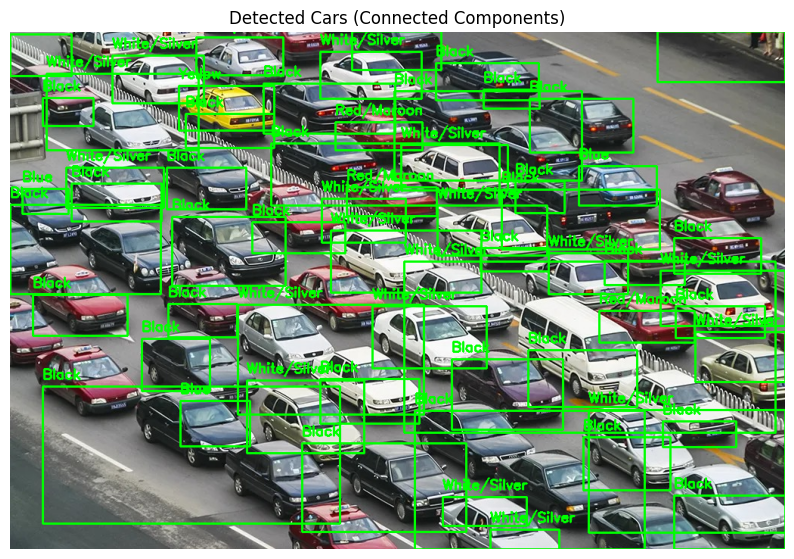

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def find_cars_with_connected_components(image_path):

    image = cv2.imread(image_path)
    if image is None:
        print(f"Error: Could not read image at {image_path}")
        return

    hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    output_image = image.copy()

    # Define color ranges
    color_data = {
        "Red/Maroon": [
            ([0, 120, 70], [10, 255, 255]),      # Lower range for red
            ([160, 120, 70], [180, 255, 255])   # Upper range for red
        ],
        "White/Silver": [
            ([0, 0, 180], [180, 40, 255])
        ],
        "Yellow": [
            ([22, 93, 0], [45, 255, 255])
        ],
        "Blue": [
            ([94, 80, 2], [126, 255, 255])
        ],
        "Black": [
            ([0, 0, 0], [180, 255, 50])
        ],
    }

    # Process each color name and its list of HSV ranges
    for color_name, hsv_ranges in color_data.items():
        # Create an empty mask to combine all ranges for the current color
        combined_mask = np.zeros(hsv_image.shape[:2], dtype="uint8")

        # Loop through each (lower, upper) tuple in the list
        for (lower_val, upper_val) in hsv_ranges:
            # Convert lists to numpy arrays
            lower = np.array(lower_val)
            upper = np.array(upper_val)

            # Create a mask for the current range and add it to the combined mask
            mask = cv2.inRange(hsv_image, lower, upper)
            combined_mask = cv2.bitwise_or(combined_mask, mask)

        # Now, find objects in the combined mask for this color
        num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(combined_mask, 4, cv2.CV_32S)

        # Iterate through all detected components
        for i in range(1, num_labels):
            area = stats[i, cv2.CC_STAT_AREA]
            x = stats[i, cv2.CC_STAT_LEFT]
            y = stats[i, cv2.CC_STAT_TOP]
            w = stats[i, cv2.CC_STAT_WIDTH]
            h = stats[i, cv2.CC_STAT_HEIGHT]

            # Filter components by size and aspect ratio
            if area > 1000 and w > h and w / h > 1.2:
                # Draw the bounding box and label the car
                cv2.rectangle(output_image, (x, y), (x + w, y + h), (0, 255, 0), 2)
                cv2.putText(output_image, color_name, (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 255, 0), 2)

    # Convert image from BGR to RGB for correct color display
    rgb_image = cv2.cvtColor(output_image, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(10, 8)) # Set figure size for better viewing
    plt.imshow(rgb_image)
    plt.title('Detected Cars (Connected Components)')
    plt.axis('off') # Hide axes
    plt.show()


# Call the function with your image file
find_cars_with_connected_components('cars.jpg')

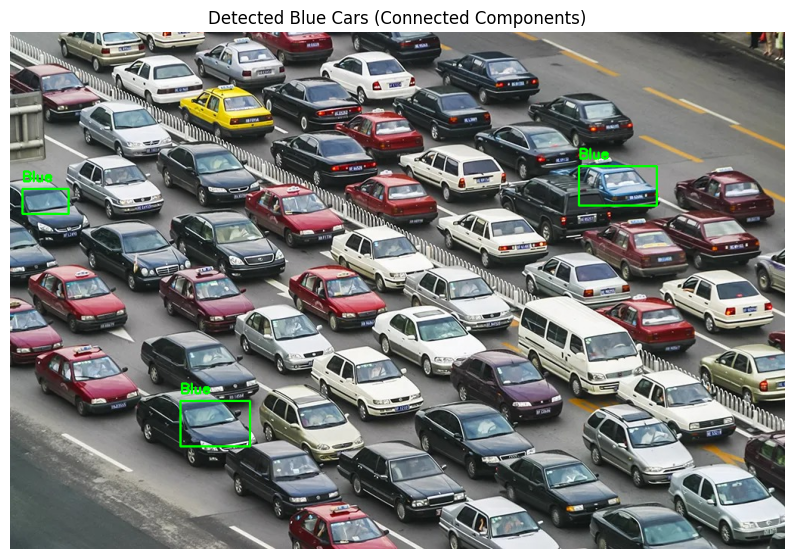

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def find_cars_with_connected_components(image_path):

    image = cv2.imread(image_path)
    if image is None:
        print(f"Error: Could not read image at {image_path}")
        return

    hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    output_image = image.copy()

    # Define all possible color ranges
    all_colors_data = {
        "Red/Maroon": [
            ([0, 120, 70], [10, 255, 255]),      # First range for red
            ([160, 120, 70], [180, 255, 255])   # Second range for red
        ],
        "White/Silver": [
            ([0, 0, 180], [180, 40, 255])
        ],
        "Yellow": [
            ([22, 93, 0], [45, 255, 255])
        ],
        "Blue": [
            ([94, 80, 2], [126, 255, 255])
        ],
        "Black": [
            ([0, 0, 0], [180, 255, 50])
        ],
    }

    # --- CHANGE HERE ---
    # Create a new dictionary with ONLY the color you want.
    # To detect a different color, just change the key (e.g., "Red/Maroon").
    color_to_detect = "Blue"
    color_data = {color_to_detect: all_colors_data[color_to_detect]}

    # Process the single color in the new dictionary
    for color_name, hsv_ranges in color_data.items():
        # Create an empty mask for the current color
        combined_mask = np.zeros(hsv_image.shape[:2], dtype="uint8")

        # Loop through each (lower, upper) tuple in the list
        for (lower_val, upper_val) in hsv_ranges:
            # Convert lists to numpy arrays
            lower = np.array(lower_val)
            upper = np.array(upper_val)

            # Create a mask for this specific range and add it to the combined mask
            mask = cv2.inRange(hsv_image, lower, upper)
            combined_mask = cv2.bitwise_or(combined_mask, mask)

        # Now, find objects in the final combined mask for this color
        num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(combined_mask, 4, cv2.CV_32S)

        # Iterate through all detected components
        for i in range(1, num_labels):
            area = stats[i, cv2.CC_STAT_AREA]
            x = stats[i, cv2.CC_STAT_LEFT]
            y = stats[i, cv2.CC_STAT_TOP]
            w = stats[i, cv2.CC_STAT_WIDTH]
            h = stats[i, cv2.CC_STAT_HEIGHT]

            # Filter components by size and aspect ratio
            if area > 1000 and w > h and w / h > 1.2:
                # Draw the bounding box and label the car
                cv2.rectangle(output_image, (x, y), (x + w, y + h), (0, 255, 0), 2)
                cv2.putText(output_image, color_name, (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 255, 0), 2)

    # Convert image from BGR to RGB for correct color display
    rgb_image = cv2.cvtColor(output_image, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(10, 8))
    plt.imshow(rgb_image)
    plt.title(f'Detected {color_to_detect} Cars (Connected Components)')
    plt.axis('off')
    plt.show()


# Call the function with your image file
find_cars_with_connected_components('cars.jpg')

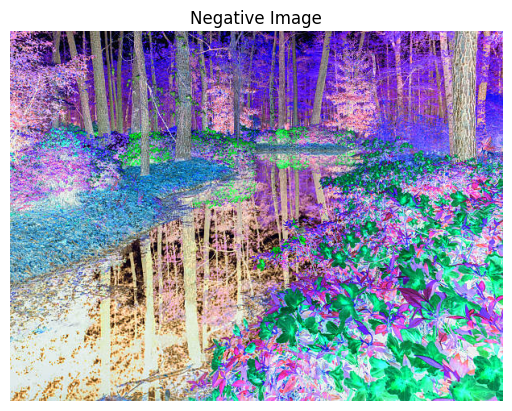

In [ ]:
import cv2
import matplotlib.pyplot as plt

# Read the image
img = cv2.imread('image.jpg')

# Apply negative transformation
negative_img = 255 - img

# Save the negative image
cv2.imwrite('negative_image.jpg', negative_img)

# Convert image to RGB for displaying with matplotlib
negative_img_rgb = cv2.cvtColor(negative_img, cv2.COLOR_BGR2RGB)

# Display using matplotlib
plt.imshow(negative_img_rgb)
plt.axis('off')
plt.title('Negative Image')
plt.show()


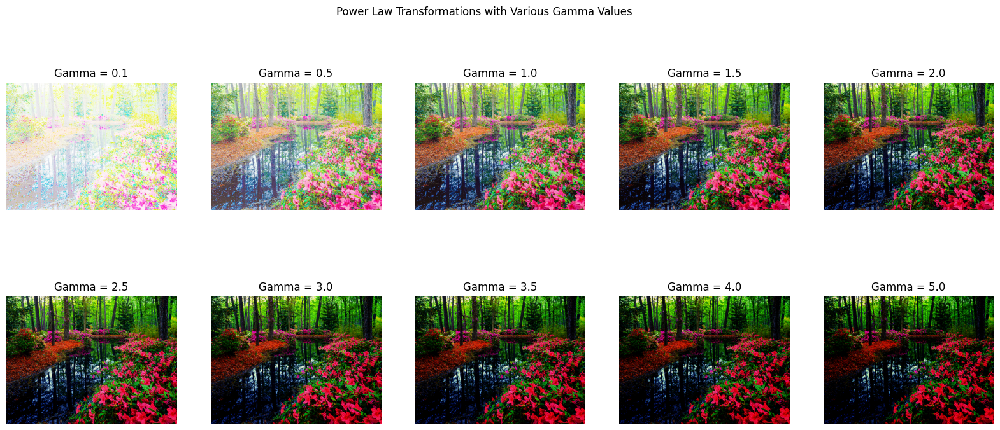

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Read the image
img = cv2.imread('image.jpg')
img_float = img / 255.0  # Normalize pixel values to [0,1]

c = 1  # Constant
gamma_values = [0.1, 0.5, 1.0, 1.5, 2.0, 2.5, 3.0, 3.5, 4.0, 5.0]  # 10 gamma values

plt.figure(figsize=(20, 8))

for i, gamma in enumerate(gamma_values):
    # Apply power law (gamma) transformation
    gamma_img = c * np.power(img_float, gamma)

    # Scale back to [0,255]
    gamma_img = np.clip(gamma_img * 255, 0, 255).astype(np.uint8)

    # Convert to RGB for display
    gamma_img_rgb = cv2.cvtColor(gamma_img, cv2.COLOR_BGR2RGB)

    # Plot each transformed image
    plt.subplot(2, 5, i+1)
    plt.imshow(gamma_img_rgb)
    plt.axis('off')
    plt.title(f'Gamma = {gamma}')

plt.suptitle('Power Law Transformations with Various Gamma Values')
plt.show()


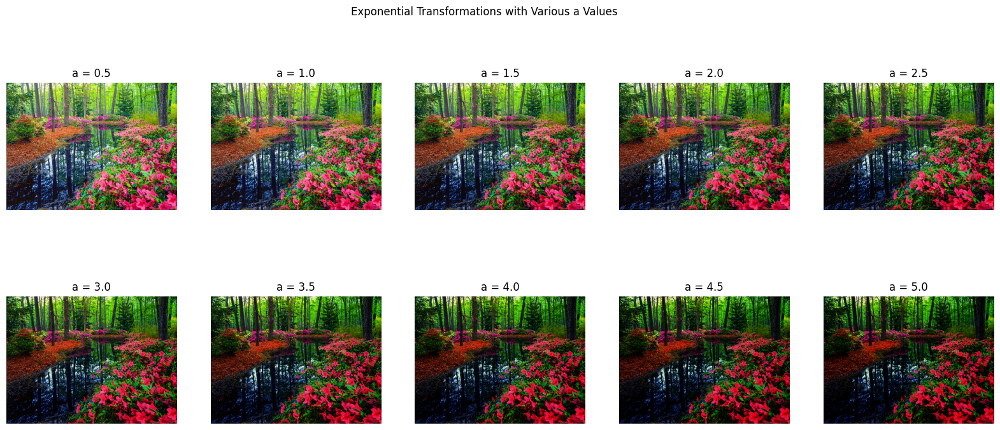

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Read the image
img = cv2.imread('image.jpg')
img_float = img / 255.0  # Normalize pixel values to [0,1]

c = 1.0  # Constant
a_values = [0.5, 1.0, 1.5, 2.0, 2.5, 3.0, 3.5, 4.0, 4.5, 5.0]  # 10 different 'a' values

plt.figure(figsize=(20, 8))

for i, a in enumerate(a_values):
    # Apply exponential transformation
    exp_img = c * (np.exp(a * img_float) - 1)

    # Normalize to [0,1] then scale to [0,255]
    exp_img = exp_img / np.max(exp_img)
    exp_img = np.clip(exp_img * 255, 0, 255).astype(np.uint8)

    # Convert to RGB for display
    exp_img_rgb = cv2.cvtColor(exp_img, cv2.COLOR_BGR2RGB)

    # Plot each transformed image
    plt.subplot(2, 5, i+1)
    plt.imshow(exp_img_rgb)
    plt.axis('off')
    plt.title(f'a = {a}')

plt.suptitle('Exponential Transformations with Various a Values')
plt.show()


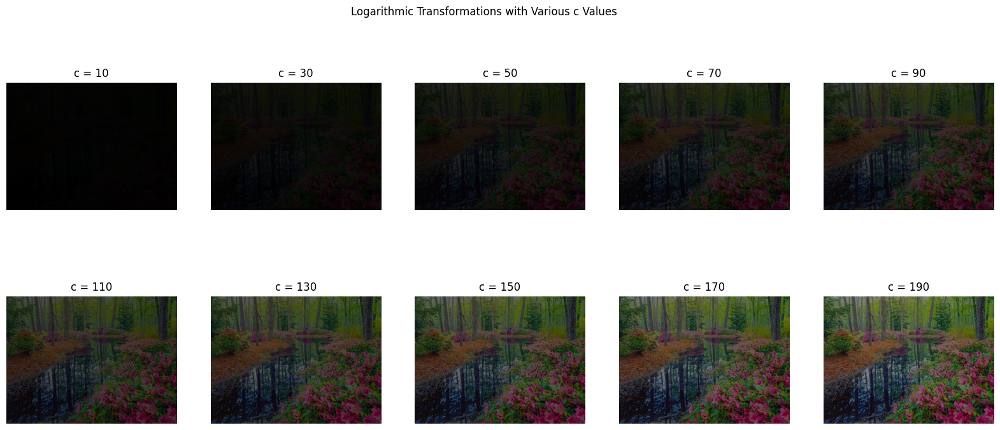

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Read the image
img = cv2.imread('image.jpg')
img_float = img / 255.0  # Normalize pixel values to [0,1]

# List of 10 different c values to test
c_values = [10, 30, 50, 70, 90, 110, 130, 150, 170, 190]

plt.figure(figsize=(20, 8))

for i, c in enumerate(c_values):
    # Apply logarithmic transformation
    log_img = c * np.log(1 + img_float)

    # Clip values and convert back to uint8
    log_img = np.clip(log_img, 0, 255).astype(np.uint8)

    # Convert to RGB for display using matplotlib
    log_img_rgb = cv2.cvtColor(log_img, cv2.COLOR_BGR2RGB)

    # Plot each transformed image
    plt.subplot(2, 5, i+1)
    plt.imshow(log_img_rgb)
    plt.axis('off')
    plt.title(f'c = {c}')

plt.suptitle('Logarithmic Transformations with Various c Values')
plt.show()


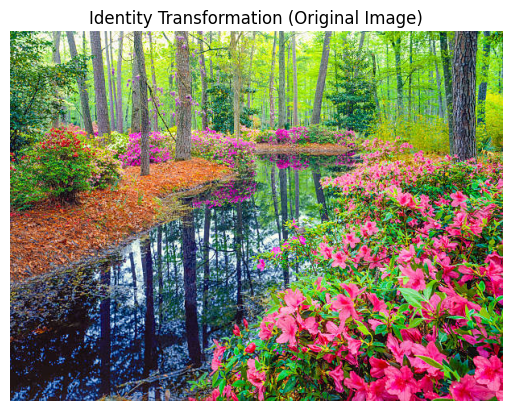

In [ ]:
import cv2
import matplotlib.pyplot as plt

# Read the image
img = cv2.imread('image.jpg')

# Identity transformation (no change)
identity_img = img.copy()

# Convert to RGB for display
identity_img_rgb = cv2.cvtColor(identity_img, cv2.COLOR_BGR2RGB)

# Display the image
plt.imshow(identity_img_rgb)
plt.axis('off')
plt.title('Identity Transformation (Original Image)')
plt.show()
